## View 1: Canny Edges

Intentionally bad for now. Fill fix in the next pass. Still have to decide if we should let it be bad or really engineer things. 

Evaluating: 100%|██████████| 100/100 [01:16<00:00,  1.31it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].



=== RESULTS ===
Mean IoU:    0.0432
Median IoU:  0.0409
Mean MHD:    117.67 px
Median MHD:  56.48 px

Best tile IoU = 0.10665666772727972 data/tiffs/10828735_15.tiff
Worst tile IoU = 0.0 data/tiffs/10078750_15.tiff


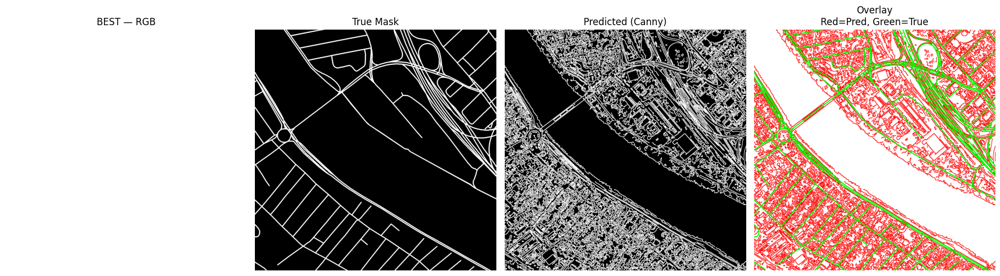

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


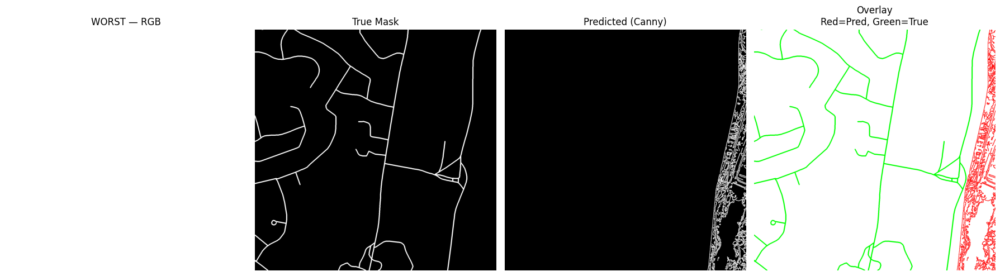

In [ ]:
from pathlib import Path
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage.feature import canny
from skimage.morphology import dilation, closing, footprint_rectangle
from scipy.ndimage import distance_transform_edt
from tqdm import tqdm


TIFF_DIR = Path("data/tiffs")

# ================================
# Metrics
# ================================

def compute_iou(pred_mask, true_mask):
    pred_bin = pred_mask > 0
    true_bin = true_mask > 0
    intersection = np.logical_and(pred_bin, true_bin).sum()
    union = np.logical_or(pred_bin, true_bin).sum()
    if union == 0:
        return 1.0 if intersection == 0 else 0.0
    return intersection / union


def modified_hausdorff_distance(mask1, mask2):
    m1 = mask1 > 0
    m2 = mask2 > 0

    if not m1.any() and not m2.any():
        return 0.0
    if not m1.any() or not m2.any():
        return 9999.0

    dt2 = distance_transform_edt(~m2)
    dt1 = distance_transform_edt(~m1)

    d1 = dt2[m1]
    d2 = dt1[m2]

    return max(d1.mean(), d2.mean())


def detect_roads_canny(rgb):
    gray = np.mean(rgb, axis=0)
    edges = canny(gray / 255.0, sigma=2)
    footprint = footprint_rectangle((3, 3))
    cleaned = closing(edges, footprint)
    cleaned = dilation(cleaned, footprint)
    return cleaned.astype(np.uint8)


# ================================
# Evaluate 100 TIFFs
# ================================

tifs = sorted(TIFF_DIR.glob("*.tif")) + sorted(TIFF_DIR.glob("*.tiff"))
tifs = tifs[:100]     # <-- evaluate first 100

results = []

for tif in tqdm(tifs, desc="Evaluating"):
    with rasterio.open(tif) as src:
        data = src.read()
        rgb = data[:3]
        true_mask = data[-1]

    pred_mask = detect_roads_canny(rgb)

    iou = compute_iou(pred_mask, true_mask)
    mhd = modified_hausdorff_distance(pred_mask, true_mask)

    results.append({
        "path": tif,
        "iou": iou,
        "mhd": mhd,
        "rgb": rgb,
        "pred": pred_mask,
        "true": true_mask
    })


# ================================
# Best and worst by IoU
# ================================

best = max(results, key=lambda r: r["iou"])
worst = min(results, key=lambda r: r["iou"])

print("\n=== RESULTS ===")
print(f"Mean IoU:    {np.mean([r['iou'] for r in results]):.4f}")
print(f"Median IoU:  {np.median([r['iou'] for r in results]):.4f}")
print(f"Mean MHD:    {np.mean([r['mhd'] for r in results]):.2f} px")
print(f"Median MHD:  {np.median([r['mhd'] for r in results]):.2f} px")

print("\nBest tile IoU =", best["iou"], best["path"])
print("Worst tile IoU =", worst["iou"], worst["path"])



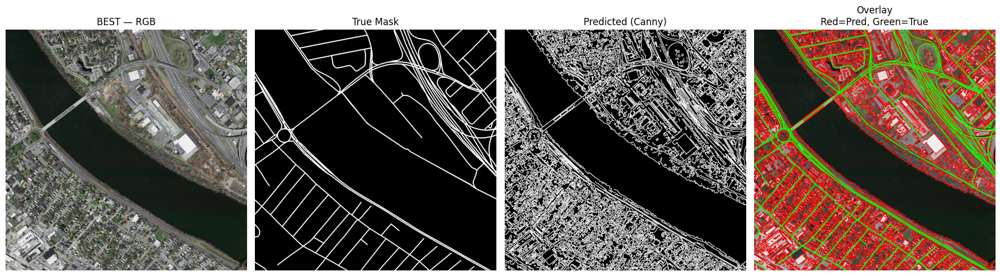

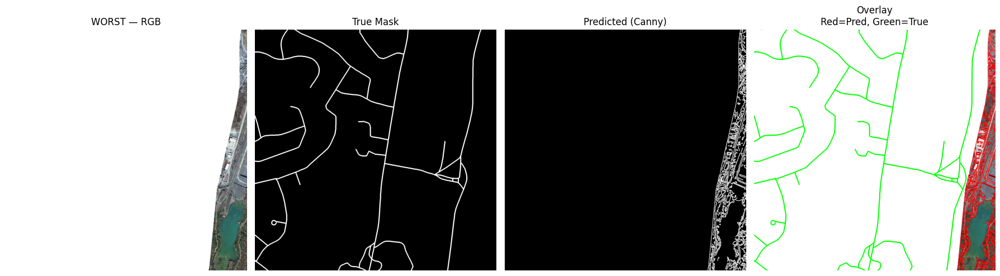

In [7]:
# ================================
# Plotting function
# ================================

def plot_result(title, rgb, pred, true):
    fig, axs = plt.subplots(1, 4, figsize=(18, 5))

    # FIX: convert float32 0–255 → float 0–1
    rgb_norm = (rgb / 255.0).clip(0, 1)

    axs[0].imshow(np.moveaxis(rgb_norm, 0, -1))
    axs[0].set_title(title + " — RGB")
    axs[0].axis("off")

    axs[1].imshow(true, cmap="gray")
    axs[1].set_title("True Mask")
    axs[1].axis("off")

    axs[2].imshow(pred, cmap="gray")
    axs[2].set_title("Predicted (Canny)")
    axs[2].axis("off")

    overlay = np.moveaxis(rgb_norm.copy(), 0, -1)
    overlay[pred > 0] = [1.0, 0, 0]   # red predictions
    overlay[true > 0] = [0, 1, 0]     # green truth

    axs[3].imshow(overlay)
    axs[3].set_title("Overlay\nRed=Pred, Green=True")
    axs[3].axis("off")

    plt.tight_layout()
    plt.show()


# ================================
# Plot Best & Worst
# ================================

plot_result("BEST", best["rgb"], best["pred"], best["true"])
plot_result("WORST", worst["rgb"], worst["pred"], worst["true"])

In [20]:
# Sort results by IoU ascending (worst first)
worst_10 = sorted(results, key=lambda r: r["iou"])[:10]

print("\n=== WORST 10 TILES (by IoU) ===")
for i, r in enumerate(worst_10):
    print(f"{i+1:2d}. IoU={r['mhd']:.4f}  {r['path']}")


=== WORST 10 TILES (by IoU) ===
 1. IoU=680.9023  data/tiffs/10078750_15.tiff
 2. IoU=615.0132  data/tiffs/10378660_15.tiff
 3. IoU=451.6297  data/tiffs/10228795_15.tiff
 4. IoU=369.5974  data/tiffs/10978945_15.tiff
 5. IoU=734.1759  data/tiffs/10678870_15.tiff
 6. IoU=595.6082  data/tiffs/10678885_15.tiff
 7. IoU=173.4037  data/tiffs/10378675_15.tiff
 8. IoU=355.4508  data/tiffs/10828645_15.tiff
 9. IoU=140.2318  data/tiffs/10528675_15.tiff
10. IoU=165.9454  data/tiffs/10228675_15.tiff


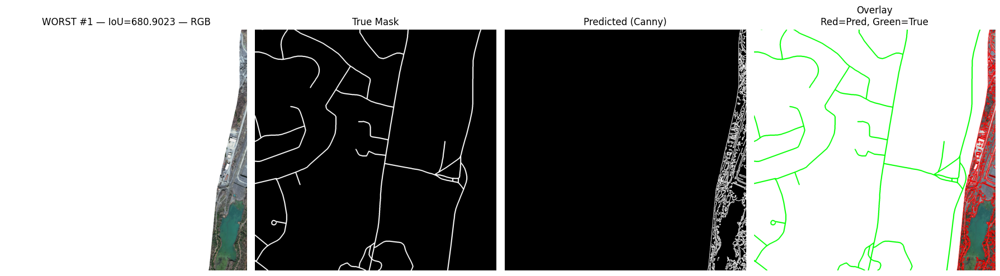

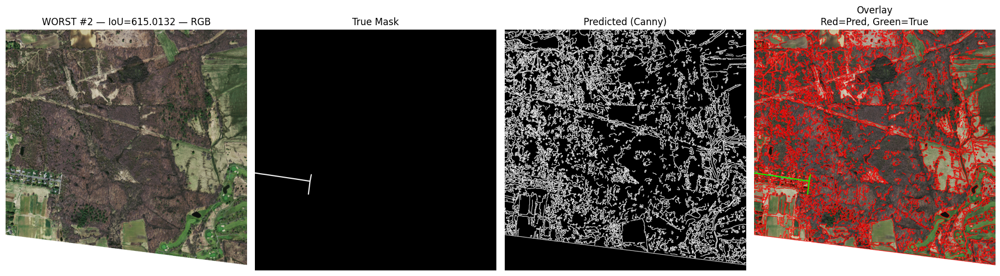

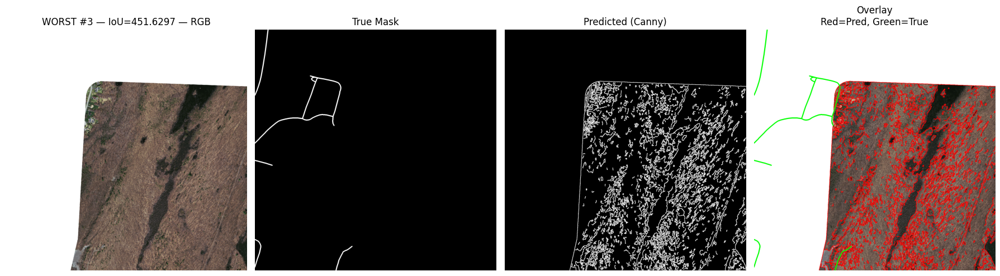

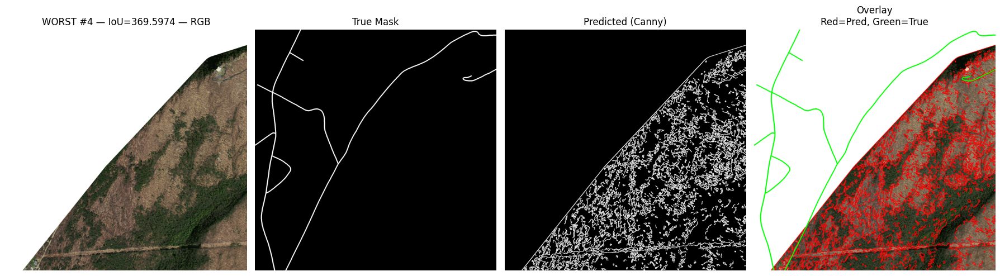

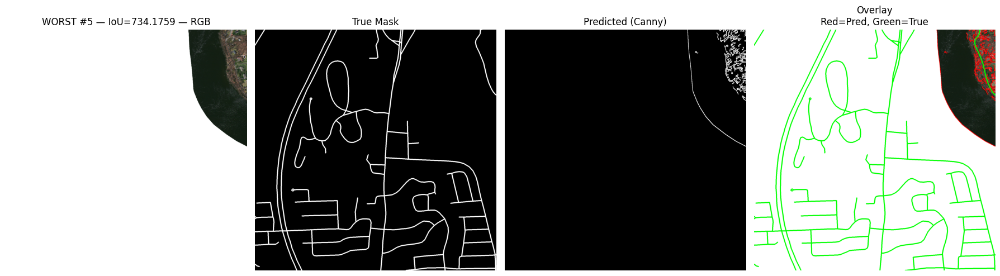

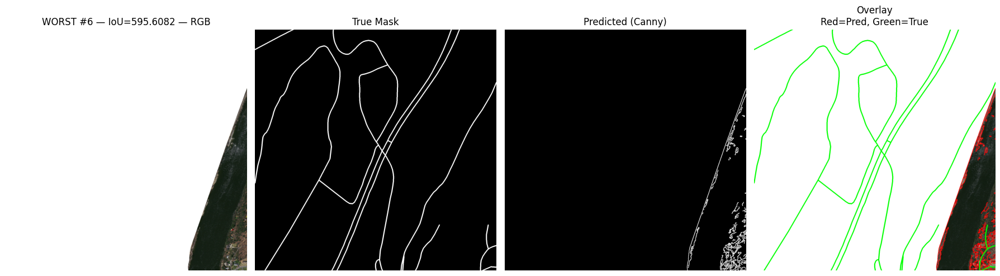

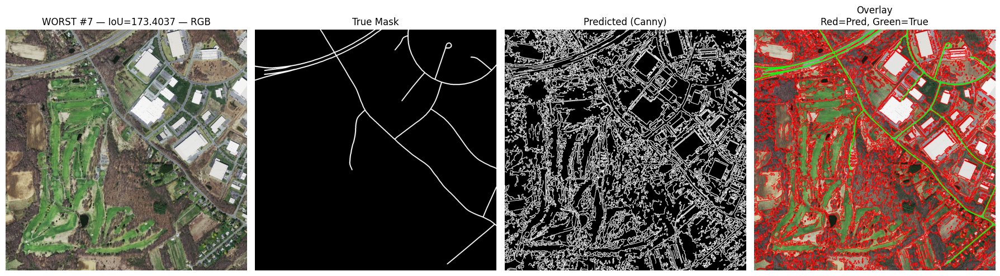

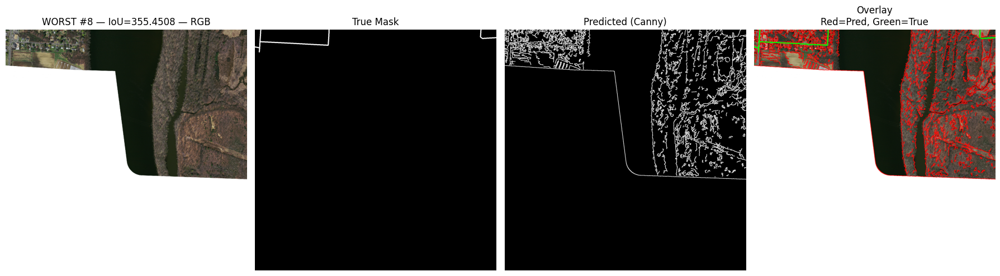

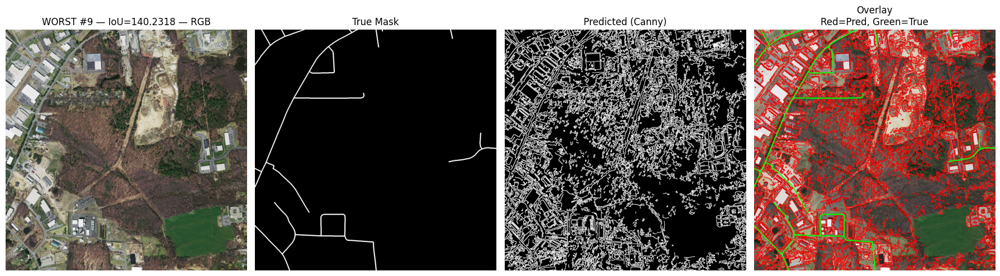

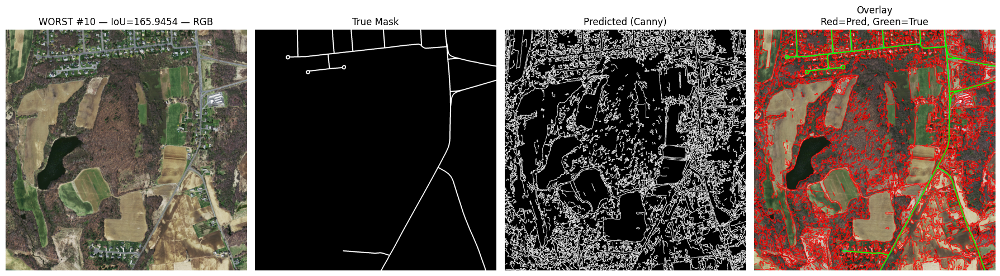

In [21]:
for i, r in enumerate(worst_10):
    title = f"WORST #{i+1} — IoU={r['mhd']:.4f}"
    plot_result(title, r["rgb"], r["pred"], r["true"])

Found image: data/roads/train/10078750_15.tiff


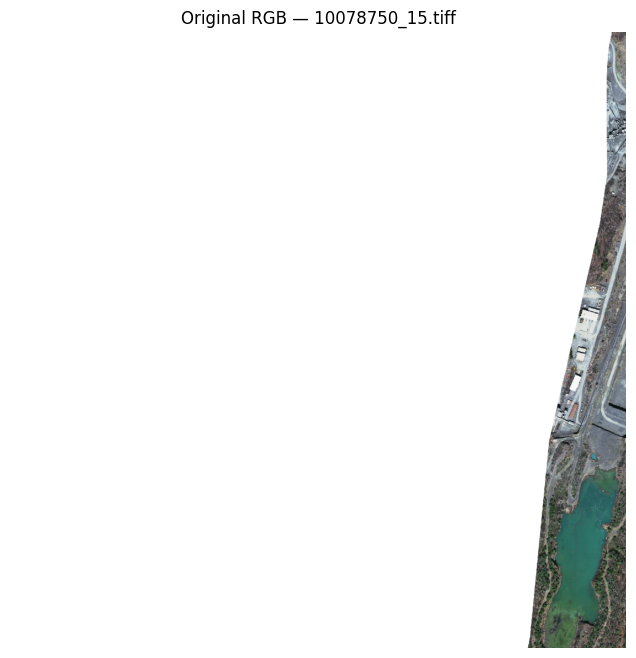

False


In [12]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# ---------------------------------------
# Choose your target tile
# ---------------------------------------
TARGET = "10078750_15.tiff"   # or .tif if that's the case
ROOT = Path("data/roads")     # base directory of the ORIGINAL dataset

# Search in train, val, test
candidates = []
for split in ["train", "val", "test"]:
    p1 = ROOT / split / TARGET
    p2 = ROOT / split / TARGET.replace(".tiff", ".tif")
    if p1.exists(): candidates.append(p1)
    if p2.exists(): candidates.append(p2)

if not candidates:
    raise FileNotFoundError(f"{TARGET} not found in train/val/test")

tile_path = candidates[0]
print("Found image:", tile_path)

# ---------------------------------------
# Load and plot RGB
# ---------------------------------------
with rasterio.open(tile_path) as src:
    rgb = src.read([1,2,3])  # first 3 bands
    rgb = np.moveaxis(rgb, 0, -1)  # HWC for matplotlib

plt.figure(figsize=(8,8))
plt.imshow(rgb)
plt.title(f"Original RGB — {tile_path.name}")
plt.axis("off")
plt.show()

import rasterio
from pathlib import Path

def is_rotated(tif):
    with rasterio.open(tif) as src:
        a, b, _, d, e, _ = src.transform[:6]
        if abs(b) > 1e-6 or abs(d) > 1e-6:
            return True   # rotated / skewed
    return False

print(is_rotated(tile_path))